<a href="https://colab.research.google.com/github/sulaiman-shamasna/github-demo/blob/main/Torchvision_finetuning_handwritten_text_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TorchVision Handwritten Texts Detection Finetuning 

For this thesis, I will be finetuning a pre-trained [Faster R-CNN](https://arxiv.org/abs/1506.01497) model on the [*Auction Catalogs Dataset*](https://drive.google.com/file/d/1DT-OGx8AqgX8CeiZlaeYR5NPofYE4AeA/view?usp=sharing), with the corresponding [*json*](https://drive.google.com/file/d/1L3VdWbapK3WRvw4pDz6h3O9reCCMIOuR/view?usp=sharing) file. It contains 71 images (It's meant to be small just to be able to run it here quickly, it could of course be changed into a bigger one), and I will use it to illustrate how to use the new features in torchvision in order to train an object detection model on a custom dataset.

First, `pycocotools` needs to be installed. This library will be used for computing the evaluation metrics following the COCO metric for intersection over union.

In [ ]:
%%shell

pip install cython
# Install pycocotools, the version by default in Colab
# has a bug fixed in https://github.com/cocodataset/cocoapi/pull/354
pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-pdd3j6xm
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-pdd3j6xm
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done


## Loading and Preparing the Dataset
---

To get the dataset, please allow connecting to google drive to get th zipped Auction Catalogs Dataset - [*DATA*](https://drive.google.com/file/d/1Sf5iInX4y8xO6UWrSPxVOtR5pbmMWzMC/view?usp=sharing) file, which contains the catalog images as well as the corresponding `.json` file.

IMPORTANT: Make sure to upload the [*dataset*](https://drive.google.com/file/d/1Sf5iInX4y8xO6UWrSPxVOtR5pbmMWzMC/view?usp=sharing) into your google drive.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


The following, however, reads the json file as well as does unzip the dataset imported from google drive and import it to this directory, making them ready to use for the next step, i.e., creating the data loader.

In [ ]:

# Get and unzip the data imported from Google Drive
!unzip -uq "/content/drive/My Drive/DATA.zip"

## Defining the Dataloader
---

The reference scripts for training object detection for handwritten text detection allows for easily supporting adding new custom datasets. The dataset should inherit from the standard `torch.utils.data.Dataset` class, and implement `__len__` and `__getitem__`. This section has the additional function `get_mask`, however, is not important for this task, at it's used for segmentation problem (there's no use for it here).

The only specificity that we require is that the dataset `__getitem__` should return:

* image: a PIL Image of size `(H,W)`
* target: a dict containing the following fields:
  *   `boxes (FloatTensor[N, 4])`: The coordinates of the `N` bounding boxes in `[x0, y0, x1, y1]` format, ranging from `0` to `W` and `0` to `H`.
  *   `labels (Int64Tensor[N])`: The label for each bounding box. `0` represents always the background class.
  *   `image_id (Int64Tensor[1])`: An image identifier. It should be unique between all the images in the dataset, and is used during evaluation.
  *   `area (Tensor[N])`: The area of the bounding box. This is used during evaluation with the COCO metric, to separate the metric scores between small, medium and large boxes.
  *   `iscrowd (UInt8Tensor[N])`:  Instances with iscrowd=True will be ignored during evaluation.
  



In [ ]:

import os, sys
import numpy as np
import torch
from PIL import Image
import cv2

import torchvision
from torch.utils.data import DataLoader, Dataset

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import json

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor


def get_masks(img, bbox):

    W,H = img.size
    zeros = torch.zeros(4,H,W)
    masks = zeros.to(dtype=torch.uint8)
    bbox1 = bbox[0]
    bbox2 = bbox[1]
    bbox3 = bbox[2]
    bbox4 = bbox[3]

    masks[0,bbox1[1]:bbox1[3], bbox1[0]:bbox1[2]] = 1
    masks[1,bbox2[1]:bbox2[3], bbox2[0]:bbox2[2]] = 1
    masks[2,bbox3[1]:bbox3[3], bbox3[0]:bbox3[2]] = 1
    masks[3,bbox4[1]:bbox4[3], bbox4[0]:bbox4[2]] = 1

  
    return masks

class CatalogsDataset(torch.utils.data.Dataset):
    def __init__(self, root, json_path, transforms=None):
        self.root = root    
        self.json_path = json_path
        self.data = json.load(open(self.json_path)) 
        self.imgs = [i['file_name'] for i in self.data['images']]
        self.masks = [i['file_name'] for i in self.data['images']] 
        self.bbox = [i['bbox'] for i in self.data['annotations']] 
        self.area = [i['area'] for i in self.data['annotations']] 
        self.label = [i['categoty_id'] for i in self.data['annotations']] 

        self.transforms = transforms


    def __getitem__(self, idx):
        img_path = os.path.join(self.root, self.imgs[idx])
        img = Image.open(img_path).convert("RGB")

        bbox = self.bbox[idx]

        # masks = get_masks(img, bbox)
        num_boxes = len(bbox)
        bbox = torch.as_tensor(bbox, dtype=torch.float32).reshape(num_boxes,4)


        area = self.area[idx]
        areas = torch.Tensor(area)
        label = torch.ones((num_boxes,), dtype=torch.int64) 
        image_id = torch.tensor([idx])

        iscrowd = torch.zeros((num_boxes,), dtype=torch.int64)

        target = {}
        target["boxes"] = bbox
        target["labels"] = label
        # target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = areas
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
          img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

This is here just to visualize a random example from the dataset.

In [ ]:
dataset = CatalogsDataset('DATA/CATALOGS/', 'DATA/CATALOGS.json')

In [ ]:
dataset[0]

(<PIL.Image.Image image mode=RGB size=1980x2872 at 0x7F3EAEC4FB80>,
 {'boxes': tensor([[  10.,  358.,  176.,  487.],
          [  26.,  817.,  177.,  954.],
          [  48., 1139.,  161., 1297.],
          [  58., 1627.,  203., 1742.],
          [  36., 2130.,  205., 2252.],
          [ 774., 2015.,  884., 2089.],
          [1201., 1529., 1293., 1600.],
          [1238.,  753., 1310.,  814.],
          [ 891., 1061.,  969., 1120.],
          [1432.,  739., 1528.,  801.],
          [1416.,  779., 1634.,  855.],
          [1514.,  235., 1626.,  327.],
          [1518.,  281., 1748.,  365.],
          [1560.,  317., 1822.,  449.],
          [1598., 1079., 1704., 1153.],
          [1578., 1131., 1742., 1233.],
          [1532., 1509., 1650., 1585.],
          [1486., 1555., 1744., 1651.],
          [1500., 1973., 1700., 2081.],
          [1476., 2061., 1728., 2155.]]),
  'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]),
  'image_id': tensor([0]),
  'area': te

## Defining the Model -  Finetuning from a Pretrained Model
---
In our case, I want to fine-tune from a pre-trained model, so I'll be using [Faster R-CNN](https://arxiv.org/abs/1506.01497).

In [ ]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

      
def get_instance_segmentation_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    return model



## Cloning Necessary Stuff
---

In [ ]:
%%shell

# Download TorchVision repo to use some files from
# references/detection
git clone https://github.com/pytorch/vision.git
cd vision
git checkout v0.8.2

cp references/detection/utils.py ../
cp references/detection/transforms.py ../
cp references/detection/coco_eval.py ../
cp references/detection/engine.py ../
cp references/detection/coco_utils.py ../

Cloning into 'vision'...
remote: Enumerating objects: 337139, done.
remote: Counting objects: 100% (53213/53213), done.
remote: Compressing objects: 100% (892/892), done.
remote: Total 337139 (delta 52511), reused 52867 (delta 52293), pack-reused 283926
Receiving objects: 100% (337139/337139), 676.86 MiB | 17.81 MiB/s, done.
Resolving deltas: 100% (310568/310568), done.
Note: switching to 'v0.8.2'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at 2f40a483d7 [v0.8.X] .circleci: Add Python 3.9 to CI (#3063)


## Importing Necessary Files and Defining the Transforms
---

IMPORTANT: You might encounter problem here with some dependencies, however please comment in line 8 (`import torch._six`) from `coco_eval.py` file.

In [ ]:
from engine import train_one_epoch, evaluate
import utils
import transforms as T


def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

## Testing forward() Method (Optional)
---
Before iterating over the dataset, it’s good to see what the model expects during training and inference time on sample data.

In [ ]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
dataset = CatalogsDataset('DATA/CATALOGS/', 'DATA/CATALOGS.json', get_transform(train=True))
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn
)
# For Training
images,targets = next(iter(data_loader))
images = list(image for image in images)
targets = [{k: v for k, v in t.items()} for t in targets]
output = model(images,targets)   # Returns losses and detections
# For inference
model.eval()
x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
predictions = model(x)           # Returns predictions


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 90.5MB/s]
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker pro

In [ ]:
dataset_test = CatalogsDataset('DATA/CATALOGS/', 'DATA/CATALOGS.json', get_transform(train=False))
data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

## Creating Train and Test Splits
---

In [ ]:
# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:50])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-20:])

In [ ]:
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

## Putting Everything Together
---
Defining Training Settings and Writing the Trainig Loop





In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# our dataset has two classes only - background and person
num_classes = 2

# get the model using our helper function
model = get_instance_segmentation_model(num_classes)
# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

In [ ]:
# let's train it for 10 epochs
from torch.optim.lr_scheduler import StepLR
num_epochs = 5

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    # evaluate(model, data_loader_test, device=device)
  
# torch.save(model.state_dict(), 'TRAINED-MODEL-DICT.pth')
torch.save(model,'TRAINED-MODEL.pth')

Epoch: [0]  [ 0/25]  eta: 0:01:55  lr: 0.000213  loss: 1.9660 (1.9660)  loss_classifier: 0.5312 (0.5312)  loss_box_reg: 0.0102 (0.0102)  loss_objectness: 1.3685 (1.3685)  loss_rpn_box_reg: 0.0561 (0.0561)  time: 4.6363  data: 2.4419  max mem: 2437
Epoch: [0]  [10/25]  eta: 0:00:16  lr: 0.002294  loss: 1.4193 (1.9678)  loss_classifier: 0.4394 (0.4379)  loss_box_reg: 0.2592 (0.2894)  loss_objectness: 0.7433 (1.1438)  loss_rpn_box_reg: 0.0750 (0.0966)  time: 1.1279  data: 0.3236  max mem: 2681
Epoch: [0]  [20/25]  eta: 0:00:04  lr: 0.004376  loss: 1.0824 (1.4441)  loss_classifier: 0.2992 (0.3575)  loss_box_reg: 0.2494 (0.2864)  loss_objectness: 0.3069 (0.7003)  loss_rpn_box_reg: 0.0861 (0.0999)  time: 0.7464  data: 0.0878  max mem: 3625
Epoch: [0]  [24/25]  eta: 0:00:00  lr: 0.005000  loss: 0.9221 (1.3522)  loss_classifier: 0.2875 (0.3474)  loss_box_reg: 0.2592 (0.3004)  loss_objectness: 0.2264 (0.6117)  loss_rpn_box_reg: 0.0521 (0.0927)  time: 0.7253  data: 0.0792  max mem: 3625
Epoch: [

## Testing the Trained Model
---
Here you can test the trained  model by selecting an exampe from the dataset, visualizing it, and draw the predicted bboxes afterwards. The Result will be saved in the given path.

In [ ]:
# pick one image from the test set
img, _ = dataset[7]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

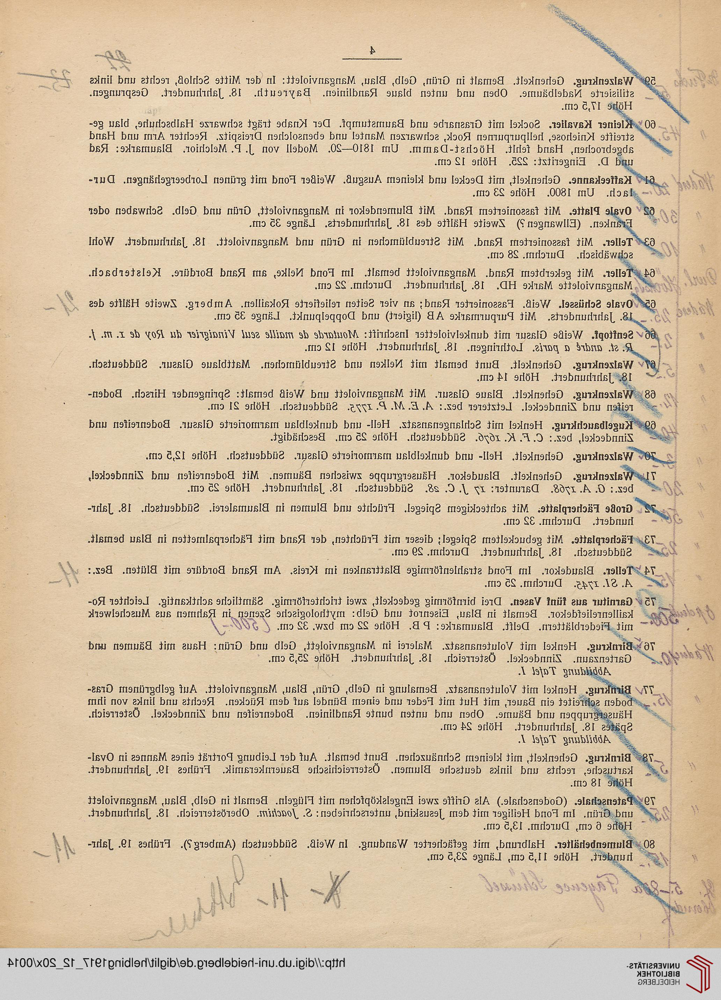

In [ ]:
Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

In [ ]:

from torchvision.utils import draw_bounding_boxes
from torchvision.io import read_image

Boxes = prediction[0]['boxes']

img_ = dataset[7][0]
img = img_.to(torch.uint8)

img = draw_bounding_boxes(img, Boxes, width=3, colors=(255,255,0))
img = torchvision.transforms.ToPILImage()(img)
img.save('predictions.jpg')

Here you can find the [*Predicted Labels*](https://drive.google.com/file/d/1n6e5LzFMfAX5cXnh5b2Vu0HIrMzz1h0m/view?usp=sharing) for the corresponding given [*image*](https://drive.google.com/file/d/1tZj1E9iOCdvjuEjJQ8oqrpyAlA7w9fkn/view?usp=sharing) above!

The entire procedure above would give this  [Trained Model](https://drive.google.com/file/d/1b19zE_gWqaJo7NVRfioHuzvBNvp_oxmP/view?usp=sharing). You can load it and test it on the images presented here. Just use the following commance to save training time.

In [ ]:
# to load the model:
model = torch.load('TRAINED-MODEL.pth')

In [ ]:
# import shutil

# # Specify the path to the directory or files you want to download
# file_path = current_directory

# # Specify the path to save the zip file
# save_path = '/content/vision'

# # Create a zip file
# shutil.make_archive(save_path, 'zip', '/content/vision')

# # Download the zip file
# from google.colab import files
# files.download(save_path + '.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>